<a href="https://colab.research.google.com/github/xinyiguan/JoystickTracking_ECoG_Decoding/blob/main/JoystickTracking_ECoG_data_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visualization of Joystick Tracking dataset

---

> By: Xinyi Guan


This notebook contains the scripts for data visualization of the Joystick Tracking ECoG dataset.

In [1]:
# @title Install

!pip install mne


[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# @title Imports

import os, requests
import numpy as np
from matplotlib import rcParams 
from matplotlib import pyplot as plt

In [3]:
# @title Load dataset from osf

fname = 'joystick_track.npz'
url = "https://osf.io/6jncm/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)


In [4]:
# @title Load all data for single subject from dataset

# @markdown 1. Loading V for selected subject
# @markdown - change the subjID (index goes from 0 to 3)

alldat = np.load(fname, allow_pickle=True)['dat']
dat = alldat[0]

## CHANGE ID HERE =====================================

subjID=2 #index goes from 0 to 3

## ====================================================

subj = dat[subjID]
subj_name = str('subject '+ str(subjID))
print(subj_name)
print('subj.keys: ', subj.keys())


# @markdown 2. Parameters (dict keys) of selected subject
V = subj['V'].astype('float32')
targetX = subj['targetX'].flatten()   # np array 1D
targetY = subj['targetY'].flatten()   # np array 1D
cursorX = subj['cursorX'].flatten()   # np array 1D
cursorY = subj['cursorY'].flatten()   # np array 1D
locs    = subj['locs']                # [[a1 b1 c1] [a2 b2 c2] ... [a60 b60 c60]] 
hemisphere = subj['hemisphere']       # list of strings
lobe = subj['lobe']                   # ...
gyrus = subj['gyrus']                 # ...
Brodmann_Area = subj['Brodmann_Area'] # ...


subject 2
subj.keys:  dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])


# 1: Visualization function:

To plot the movement trajectory, simply copy the following "helper functions" block code. Specifiy your inputs for the ```plot_mvmt_trajectory``` function:

*   `xs` is the cursor/target position along x-axis
*   `ys` is the cursor/target position along y-axis
*   `spacing_index` is the spacing within the sequence (i.e., how many points you want to skip plotting) 

*   `title` title your plot






In [5]:
# @title 1.1. Functions: 2D Movement Trajectory plot
import numpy as np
from matplotlib import pyplot as plt

def sample_indices(seq, starting_index, k):
  resulted_seq = seq[starting_index::k]
  n = int(len(seq))
  index_list = list((np.arange(n)*k)[:len(resulted_seq)])
  return resulted_seq, index_list


def plot_mvmt_trajectory(xs, ys, spacing_index, title):
  xs_seq_val = sample_indices(xs, 0, spacing_index)[0]
  ys_seq_val = sample_indices(ys, 0, spacing_index)[0]
  indices = sample_indices(ys, 0, spacing_index)[1]
  print('num of sampled pts from sequences', len(indices))

  ax = plt.axes(aspect=1)
  ax.scatter(xs_seq_val,ys_seq_val, c=indices, s=2)
  ax.set_xlim(-2000, 34500)
  ax.set_ylim(-2000,34500)
  ax.set_title(title)  



num of sampled pts from sequences 2688


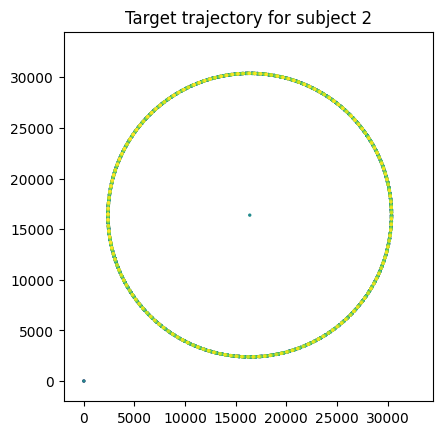

In [6]:
# @title Sample plot 1 
# @markdown movement trajectory of target for subject 4 over time 


xs_target = targetX[:]
ys_target = targetY[:]

plot_mvmt_trajectory(xs_target, ys_target, spacing_index=50, title = 'Target trajectory for ' + subj_name)

num of sampled pts from sequences 3359


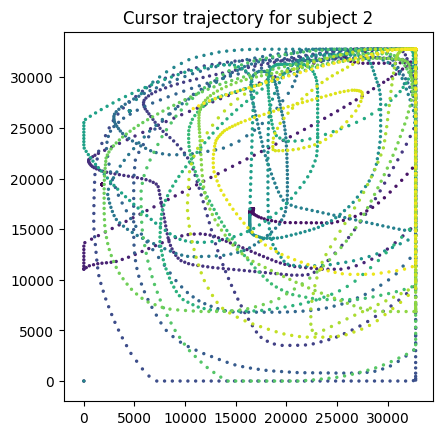

In [7]:
# @title Sample plot 2
# @markdown movement trajectory of cursor for subject 4 over time 


xs_cursor_m = cursorX[:]
ys_cursor_m = cursorY[:]

plot_mvmt_trajectory(xs_cursor_m, ys_cursor_m, spacing_index=40, title = 'Cursor trajectory for '+subj_name)

num of sampled pts from sequences 200


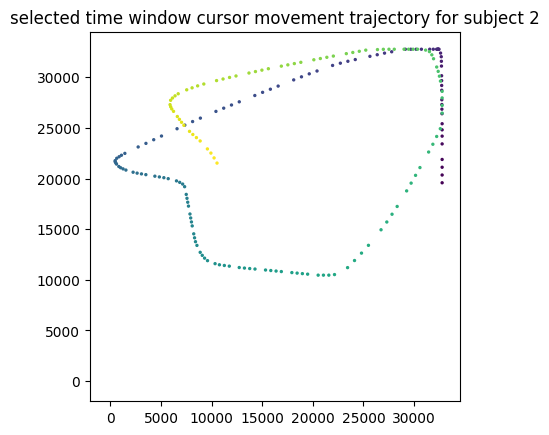

In [8]:
# @title Sample plot 3 
# @markdown Movement trajectory of cursor for subject 4 during selected time window (1000~15000) 


xs_cursor_sel = cursorX[15000:25000]
ys_cursor_sel = cursorY[15000:25000]

plot_mvmt_trajectory(xs_cursor_sel,ys_cursor_sel,spacing_index=50, title = 'selected time window cursor movement trajectory for '+subj_name)


In [9]:
# @title 1.2. Neural response of the correspoding cursor position plot (3D plot)

from mpl_toolkits import mplot3d

def plot_3d_neuralresp_vs_position(xs, ys, zs, spacing_index, title):
  """
  xs is the cursor/target position along x-axis
  ys is the cursor/target position along y-axis
  zs is the corresponding voltage value at that position
  """
  # zs = V[:,2]
  xs_seq_val = sample_indices(xs, 0, spacing_index)[0]
  ys_seq_val = sample_indices(ys, 0, spacing_index)[0]
  zs_seq_val = sample_indices(zs, 0, spacing_index)[0]
  
  indices = sample_indices(xs, 0, spacing_index)[1]
  ax = plt.axes(projection='3d')
  ax.scatter(xs_seq_val,ys_seq_val,zs_seq_val, cmap='viridis', c=indices, s=12, linewidth=0.2)

  ax.set_title(title)
  ax.set_xlabel('x-axis position')
  ax.set_ylabel('y-axis position')
  ax.set_zlabel('averaged voltage value')



In [10]:
print(V.shape) # n_time x n_channel

print(V[0].shape)

(134360, 64)
(64,)


In [11]:
# @markdown get average(mean) of the neural response across channels

avg_v = np.mean(V, axis=1)


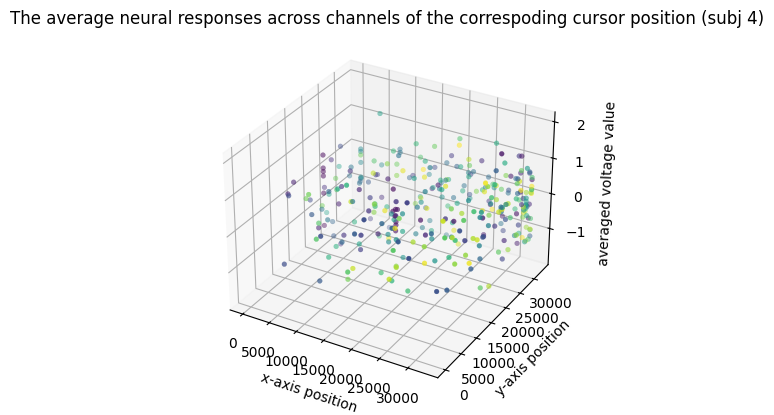

In [12]:
# @title Sample plot
# @markdown average neural responses across channels of the correspoding cursor position
xs = cursorX[:]
ys = cursorY[:]
zs = avg_v # plot channel 2
plot_3d_neuralresp_vs_position(xs, ys, zs, 400, title = 'The average neural responses across channels of the correspoding cursor position (subj 4)')



# 2: Plot raw ECoG data (MNE section)

In [13]:
# @title 2.0. Import mne

import mne
# For elimiating warnings
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

import mne.viz


In [14]:
# @title 2.1 Load all data for single subject from dataset

# @markdown 1. Loading V for selected subject
# @markdown - change the subjID (index goes from 0 to 3)

alldat = np.load(fname, allow_pickle=True)['dat']
dat = alldat[0]

## CHANGE ID HERE =====================================

subjID=1 #index goes from 0 to 3

## ====================================================

subj = dat[subjID]
subj_name = str('subject '+ str(subjID))
print(subj_name)
print('subj.keys: ', subj.keys())


# @markdown 2. Parameters (dict keys) of selected subject
V = subj['V'].astype('float32')
targetX = subj['targetX'].flatten()   # np array 1D
targetY = subj['targetY'].flatten()   # np array 1D
cursorX = subj['cursorX'].flatten()   # np array 1D
cursorY = subj['cursorY'].flatten()   # np array 1D
locs    = subj['locs']                # [[a1 b1 c1] [a2 b2 c2] ... [a60 b60 c60]] 
hemisphere = subj['hemisphere']       # list of strings
lobe = subj['lobe']                   # ...
gyrus = subj['gyrus']                 # ...
Brodmann_Area = subj['Brodmann_Area'] # ...


subject 1
subj.keys:  dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])


In [15]:
# @title 2.1.1. Create MNE object (original raw)

data = V.T
n_channels = V.shape[1]
sampling_freq = 1000  # in Hertz
ch_types = ['ecog']*n_channels
ch_names = ['chan'+str(channel) for channel in list(range(n_channels))]

info = mne.create_info(ch_names, sfreq=sampling_freq, ch_types='ecog', verbose=None)

raw = mne.io.RawArray(data, info)
print(raw.info)



Creating RawArray with float64 data, n_channels=64, n_times=248640
    Range : 0 ... 248639 =      0.000 ...   248.639 secs
Ready.
    Range : 0 ... 248639 =      0.000 ...   248.639 secs
Ready.
<Info | 7 non-empty values
 bads: []
 ch_names: chan0, chan1, chan2, chan3, chan4, chan5, chan6, chan7, chan8, ...
 chs: 64 ECoG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 1000.0 Hz
>


Using matplotlib as 2D backend.


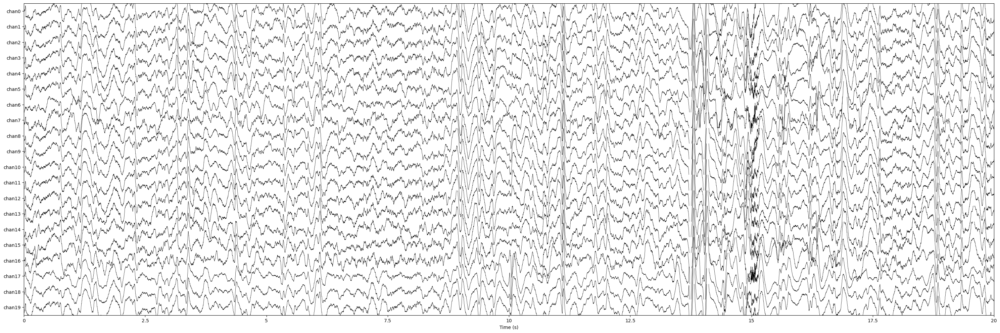

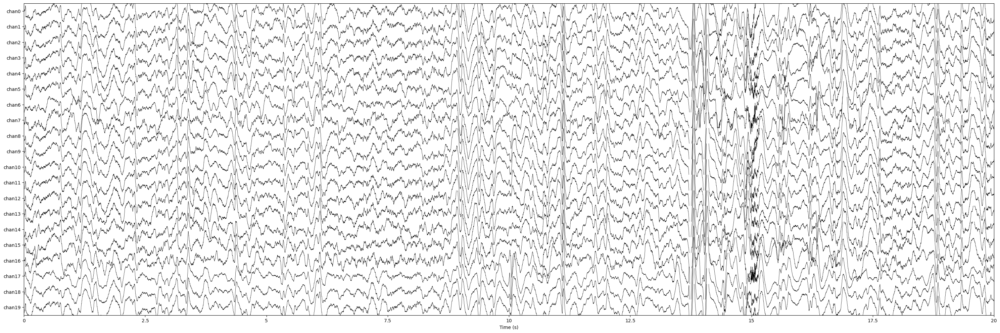

In [16]:
# @title 2.1.2. Plot raw channels

mne.viz.plot_raw(raw, n_channels=20, start = 0, duration = 20, scalings='auto', title='Raw signals', 
         show=True, block=True, show_scalebars=False, show_scrollbars=False)

In [17]:
# @title 2.2. Plotting extended raw
# @markdown - Loading V

# @markdown - Plot selected channels for selected time window:
from matplotlib import rcParams 
from matplotlib import pyplot as plt
rcParams['figure.figsize'] = [20, 8]
rcParams['font.size'] =15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

alldat = np.load(fname, allow_pickle=True)['dat']
dat = alldat[0]

## CHANGE ID HERE =====================================

subjID=1 #index goes from 0 to 3

## ====================================================

subj = dat[subjID]
subj_name = str('subject '+ str(subjID))

# @markdown - Set parameters (dict keys) of selected subject
V = subj['V'].astype('float32')
targetX = subj['targetX'].flatten()   # np array 1D
targetY = subj['targetY'].flatten()   # np array 1D
cursorX = subj['cursorX'].flatten()   # np array 1D
cursorY = subj['cursorY'].flatten()   # np array 1D
locs    = subj['locs']                # [[a1 b1 c1] [a2 b2 c2] ... [a60 b60 c60]] 
hemisphere = subj['hemisphere']       # list of strings
lobe = subj['lobe']                   # ...
gyrus = subj['gyrus']                 # ...
Brodmann_Area = subj['Brodmann_Area'] # ...


In [18]:
# @title 2.2.1. Create an extended raw object 
# @markdown add targetX, targetY, cursorX, cursorY as channel to raw object with selected channels

V_data = V.T #(n_channel x n_times), len(V_data[0]) = 134360

position_data = np.vstack((cursorX, targetX, cursorY, targetY))

extended_data = np.vstack((V_data, position_data))

n_ecog_channels = V.shape[1]

sampling_freq = 1000  # in Hertz
ex_ch_types = ['ecog']*n_ecog_channels + ['misc']*4
ex_ch_names = ['chan'+str(channel) for channel in list(range(n_ecog_channels))]+ ['Xcur']+['Xtar']+ ['Ycur']+ ['Ytar']


ex_info = mne.create_info(ex_ch_names, sfreq=sampling_freq, ch_types=ex_ch_types, verbose=None)

extended_raw = mne.io.RawArray(extended_data, ex_info)
# print(extended_raw.info)

Creating RawArray with float64 data, n_channels=68, n_times=248640
    Range : 0 ... 248639 =      0.000 ...   248.639 secs
Ready.
    Range : 0 ... 248639 =      0.000 ...   248.639 secs
Ready.


In [19]:
# @markdown ### Select which channels and the time window to plot
# @markdown Either specify includes or excludes.

# @markdown Note: the max num of channels can plot is 20.

# channels: 
excludes = ['chan'+str(channel) for channel in list(range(0,50))]
includes = ['chan'+str(channel) for channel in list(range(25,41))]+['Xtar']+['Ytar']+ ['Xcur']+ ['Ycur']
#includes = ['chan'+str(channel) for channel in list(range(48,n_ecog_channels))]+['Xtar']+['Ytar']+ ['Xcur']+ ['Ycur']

picks = mne.pick_channels(ch_names=ex_ch_names, include=includes, exclude=[])

# time window (specifiy starting time and duration):
start = 0
duration = 30

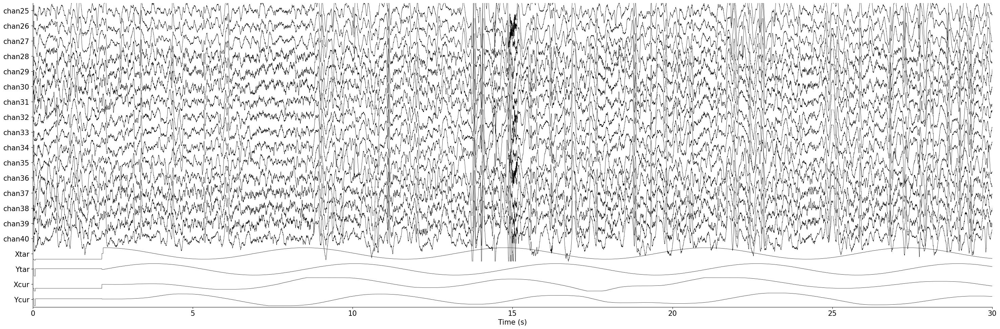

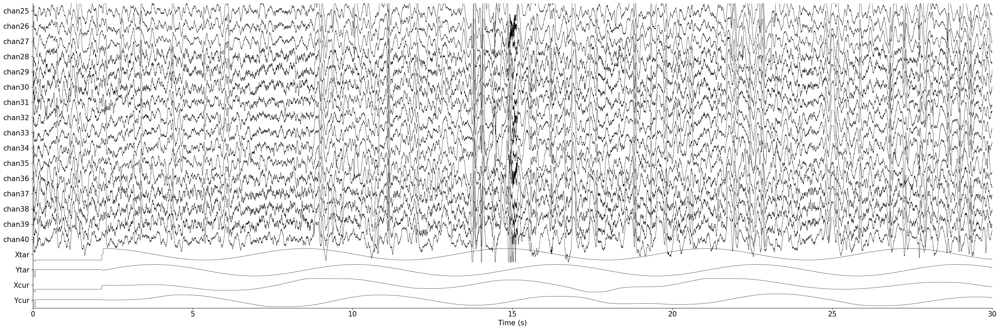

In [20]:
# @title 2.2.2. Plot selected channels for selected time window:


mne.viz.plot_raw(extended_raw, duration=duration, start=start, scalings='auto', title='Selected channels for selected time window', 
         show=True, block=True, show_scalebars=False, show_scrollbars=False, order=picks)

# 3: Visualized one channel with neuralDSP

In [21]:
# @title install & import neuralDSP
! pip install neurodsp
from neurodsp.utils import create_times
from neurodsp.plts.time_series import plot_time_series, plot_instantaneous_measure




[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [22]:
# @title 3.1 set parameters
fs = 1000
times = create_times(len(V[:, 0])/fs, fs)
print(times)

[0.00000e+00 1.00000e-03 2.00000e-03 ... 2.48637e+02 2.48638e+02
 2.48639e+02]


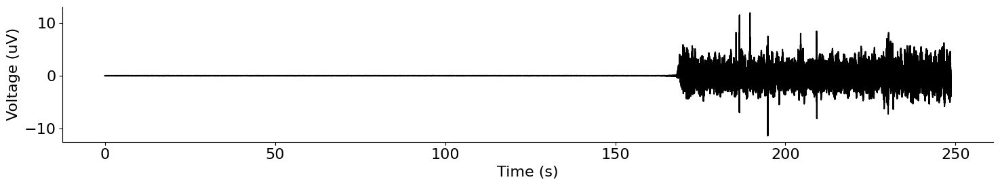

In [23]:
# @title 3.2 plot
plot_time_series(times, V[:,57])

# 4: Notch filter with MNE

Can be independent from previous sections (1-3)


Filter from extended raw


In [24]:
# @title Install and imports
!pip install mne

import mne


[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [25]:
# @title 4.1. Get the extended raw
# @title Load all data for single subject from dataset

# @markdown 1. Loading V for selected subject
# @markdown - change the subjID (index goes from 0 to 3)

alldat = np.load(fname, allow_pickle=True)['dat']
dat = alldat[0]

## CHANGE ID HERE =====================================

subjID=1 #index goes from 0 to 3

## ====================================================

subj = dat[subjID]
subj_name = str('subject '+ str(subjID))
print(subj_name)
print('subj.keys: ', subj.keys())


# @markdown 2. Parameters (dict keys) of selected subject
V = subj['V'].astype('float32')
targetX = subj['targetX'].flatten()   # np array 1D
targetY = subj['targetY'].flatten()   # np array 1D
cursorX = subj['cursorX'].flatten()   # np array 1D
cursorY = subj['cursorY'].flatten()   # np array 1D
locs    = subj['locs']                # [[a1 b1 c1] [a2 b2 c2] ... [a60 b60 c60]] 
hemisphere = subj['hemisphere']       # list of strings
lobe = subj['lobe']                   # ...
gyrus = subj['gyrus']                 # ...
Brodmann_Area = subj['Brodmann_Area'] # ...


# @markdown 3. Create an extended raw object:  
# @markdown - add targetX, targetY, cursorX, cursorY as channel to raw object with selected channels

V_data = V.T #(n_channel x n_times), len(V_data[0]) = 134360

position_data = np.vstack((cursorX, targetX, cursorY, targetY))

extended_data = np.vstack((V_data, position_data))

n_ecog_channels = V.shape[1]

sampling_freq = 1000  # in Hertz
ex_ch_types = ['ecog']*n_ecog_channels + ['misc']*4
ex_ch_names = ['chan'+str(channel) for channel in list(range(n_ecog_channels))]+ ['Xcur']+['Xtar']+ ['Ycur']+ ['Ytar']


ex_info = mne.create_info(ex_ch_names, sfreq=sampling_freq, ch_types=ex_ch_types, verbose=None)
extended_raw = mne.io.RawArray(extended_data, ex_info)

print(extended_raw.info)

subject 1
subj.keys:  dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])
Creating RawArray with float64 data, n_channels=68, n_times=248640
    Range : 0 ... 248639 =      0.000 ...   248.639 secs
Ready.
<Info | 7 non-empty values
 bads: []
 ch_names: chan0, chan1, chan2, chan3, chan4, chan5, chan6, chan7, chan8, ...
 chs: 64 ECoG, 4 misc
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: unspecified
 nchan: 68
 projs: []
 sfreq: 1000.0 Hz
>
    Range : 0 ... 248639 =      0.000 ...   248.639 secs
Ready.
<Info | 7 non-empty values
 bads: []
 ch_names: chan0, chan1, chan2, chan3, chan4, chan5, chan6, chan7, chan8, ...
 chs: 64 ECoG, 4 misc
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: unspecified
 nchan: 68
 projs: []
 sfreq: 1000.0 Hz
>


In [26]:
# @title 4.2. Perform notch filter and bandpass filter on the extended raw 

# @markdown 1. Specific frequencies to filter out from data:
# @markdown   - np.arange(60, 241, 60) in the US

extended_raw_filtered = extended_raw.copy().notch_filter(freqs=np.arange(60, 241, 60), picks=['ecog'])


# @markdown 2. Bandpass filter the notch data between 0.1Hz and 30Hz

extended_raw_filtered = extended_raw_filtered.filter(l_freq=0.1, h_freq=30, picks=['ecog'])

#print(extended_raw_filtered.info)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 6601 samples (6.601 s)

Filtering raw data in 1 contiguous segment


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


In [27]:
# @title 4.3. Plot the filtered data


# @markdown #### Select which channels and the time window to plot
# @markdown Either specify includes or excludes.

# @markdown Note: the max num of channels can plot is 20.

# channels: 
excludes = ['chan'+str(channel) for channel in list(range(0,50))]
includes = ['chan'+str(channel) for channel in list(range(30,41))]+['Xtar']+['Ytar']+ ['Xcur']+ ['Ycur']
#includes = ['chan'+str(channel) for channel in list(range(48,n_ecog_channels))]+['Xtar']+['Ytar']+ ['Xcur']+ ['Ycur']

picks = mne.pick_channels(ch_names=ex_ch_names, include=includes, exclude=[])

# time window (specifiy starting time and duration):
start = 10
duration = 30


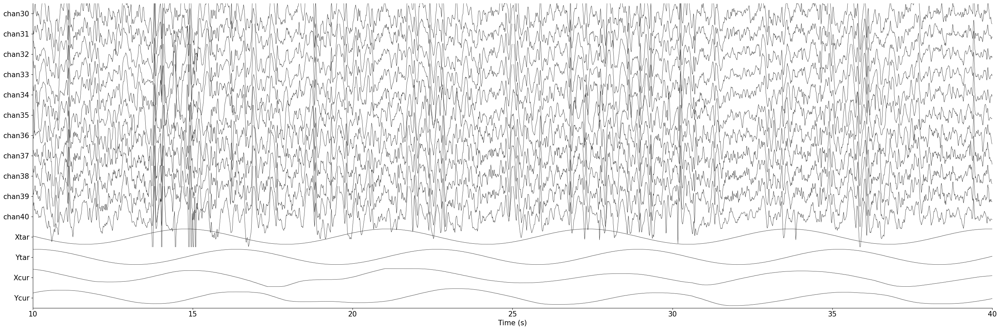

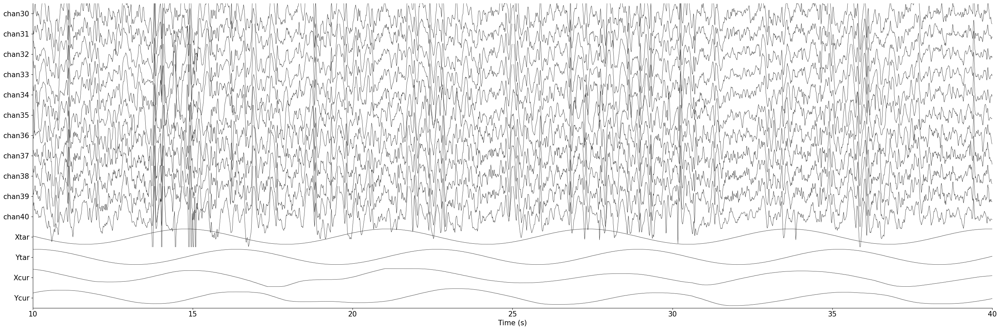

In [28]:
# @markdown Plot selected channels for selected time window:
from matplotlib import rcParams 
from matplotlib import pyplot as plt
# rcParams['figure.figsize'] = [20, 4]
# rcParams['font.size'] =15
# rcParams['axes.spines.top'] = True
# rcParams['axes.spines.right'] = True
# rcParams['figure.autolayout'] = True

mne.viz.plot_raw(extended_raw_filtered, duration=duration, start=start, scalings='auto', title='Filtered data for' + subj_name+ ': Selected channels for selected time window', 
         show=True, block=True, show_scalebars=False, show_scrollbars=False, order=picks)

In [29]:
# @title 4.3.0. MNE RAW Object --> np.array

# @markdown extended_V_nparray


print(extended_raw_filtered[:][0].shape)

extended_raw2nparray = extended_raw_filtered[:][0].T

print(extended_raw2nparray.shape)

(68, 248640)
(248640, 68)


In [30]:
# @title (additional) Install & import neuralDSP
! pip install neurodsp
from neurodsp.utils import create_times
from neurodsp.plts.time_series import plot_time_series, plot_instantaneous_measure




[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


[0.00000e+00 1.00000e-03 2.00000e-03 ... 2.48637e+02 2.48638e+02
 2.48639e+02]


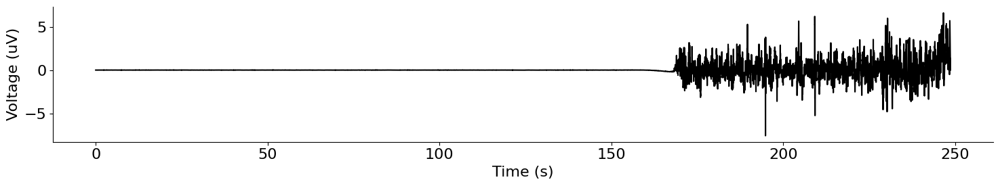

In [31]:
# @title 4.3.2 set parameters & plot single channel
fs = 1000
times = create_times(len(V[:, 0])/fs, fs)
print(times)

plot_time_series(times, extended_raw2nparray[:,57])

# 5: Linear Regressison on filtered data


Need to run section 4, at least up to 4.2





In [32]:
from scipy import signal

from matplotlib import rcParams 
from matplotlib import pyplot as plt
rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] =15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True


In [33]:
# @title 5.1. get the filtered V

filtered_V = extended_raw2nparray[:, :-4]

print(filtered_V.shape)

(248640, 64)


In [34]:
# @title 5.2. from JC: linear regression
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from scipy.signal import hilbert
from scipy.ndimage import gaussian_filter

# set up paramters

nt, nchan = filtered_V.shape

cx = np.zeros(nchan,)
cy = np.zeros(nchan,)
for j in range(nchan):
  cx[j] = np.corrcoef(V[:,j], targetX)[0,1]
  cy[j] = np.corrcoef(V[:,j], targetY)[0,1]

def rect_data(y):
  z=np.empty_like(y)
  for i in range(np.size(y,1)):
    z[:,i]=(np.abs(y[:,i]))
    return z
def c_dist(x1,y1,x2,y2):
  d= ((x1-x2) ** 2 + (y1-y2) ** 2 ) ** .5
  return d

# separating data into train and test
secval=100000
v_tr=V[:secval,:]
x_tr=cursorX[:secval]
y_tr=cursorY[:secval]

v_te=V[secval+1:-1,:]
x_te=cursorX[secval+1:-1]
y_te=cursorY[secval+1:-1]

# Creating linear models
alphav=50
lm_x=linear_model.LinearRegression()
lm_y=linear_model.LinearRegression()

lm_x_r = linear_model.Lasso(alpha=alphav)
lm_y_r = linear_model.Lasso(alpha=alphav)


#fitting LMs
lm_x.fit(v_tr,x_tr)
lm_y.fit(v_tr,y_tr)

lm_x_r.fit(v_tr,x_tr)
lm_y_r.fit(v_tr,y_tr)


Lasso(alpha=50)

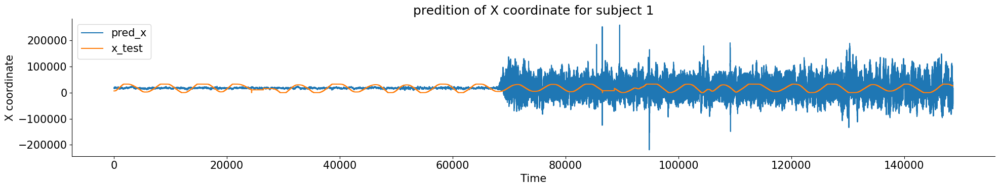

In [35]:
#X fits_cursor 
p_x=lm_x.predict(v_te)
plt.plot(p_x, label='pred_x')
plt.plot(x_te, label='x_test')
plt.title('predition of X coordinate for '+ subj_name)
plt.xlabel('Time')
plt.ylabel('X coordinate')
plt.legend()
plt.show()

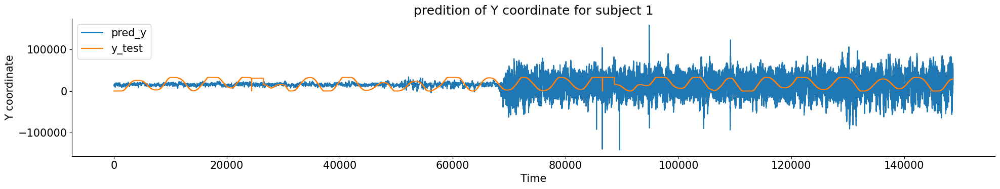

In [36]:
#Y fits_cursor 
p_y=lm_y.predict(v_te)
plt.plot(p_y, label='pred_y')
plt.plot(y_te, label='y_test')
plt.title('predition of Y coordinate for '+ subj_name)
plt.xlabel('Time')
plt.ylabel('Y coordinate')
plt.legend()
plt.show()

In [37]:
# @title 5.3. visualize predicted cursor movmenet 


# @markdown copoied Functions: 2D Movement Trajectory plot
import numpy as np
from matplotlib import pyplot as plt

def sample_indices(seq, starting_index, k):
  resulted_seq = seq[starting_index::k]
  n = int(len(seq))
  index_list = list((np.arange(n)*k)[:len(resulted_seq)])
  return resulted_seq, index_list


def plot_mvmt_trajectory(xs, ys, spacing_index, title):
  xs_seq_val = sample_indices(xs, 0, spacing_index)[0]
  ys_seq_val = sample_indices(ys, 0, spacing_index)[0]
  indices = sample_indices(ys, 0, spacing_index)[1]
  # xs_seq_val = sample_indices(xs, 75000, spacing_index)[0]
  # ys_seq_val = sample_indices(ys, 75000, spacing_index)[0]
  # indices = sample_indices(ys, 75000, spacing_index)[1] #change for subj[1]
  print('num of sampled pts from sequences', len(indices))

  ax = plt.axes(aspect=1)
  ax.scatter(xs_seq_val,ys_seq_val, c=indices, s=2)
  ax.set_xlim(-2000, 34500)
  ax.set_ylim(-2000,34500)
  ax.set_title(title)  



num of sampled pts from sequences 2973


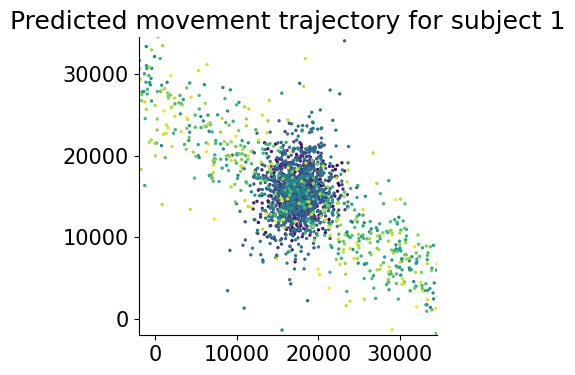

In [38]:

# @markdown predicted movement trajectory of cursor for selected subject over time 
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plot_mvmt_trajectory(p_x, p_y, spacing_index = 50, title='Predicted movement trajectory for '+ subj_name)

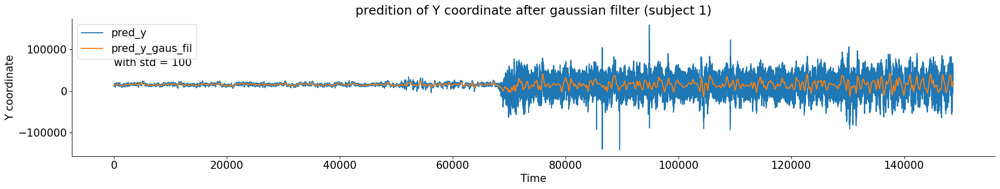

In [39]:
# @title 5.4. Apply gaussian filter on the prediction

from scipy.ndimage import gaussian_filter1d


p_x_gaus_fil = gaussian_filter1d(p_x, 100)
p_y_gaus_fil = gaussian_filter1d(p_y, 100)


plt.plot(p_y, label = 'pred_y')
plt.plot(p_y_gaus_fil, label = 'pred_y_gaus_fil')
plt.title('predition of Y coordinate after gaussian filter ('+ subj_name+ ')')
plt.xlabel('Time')
plt.ylabel('Y coordinate')
plt.text(x=0, y=60000, s='with std = 100')
plt.legend()
plt.show()

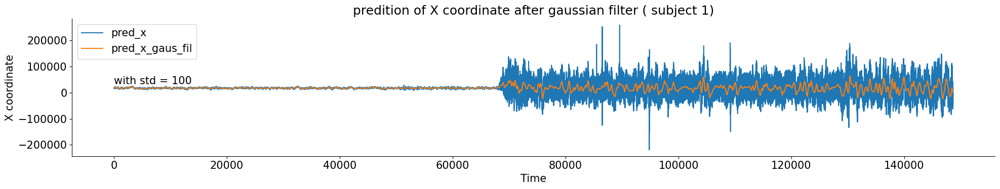

In [40]:
plt.plot(p_x, label = 'pred_x')
plt.plot(p_x_gaus_fil, label = 'pred_x_gaus_fil')
plt.title('predition of X coordinate after gaussian filter ( '+ subj_name+ ')')
plt.xlabel('Time')
plt.ylabel('X coordinate')
plt.text(x=0, y=32000, s='with std = 100')
plt.legend()
plt.show()

num of sampled pts from sequences 7432


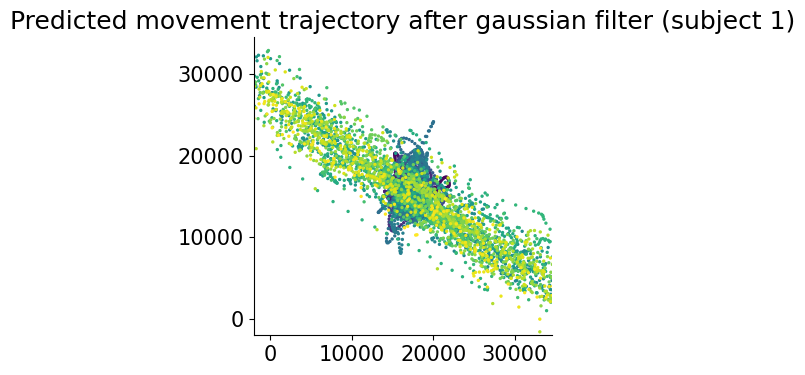

In [41]:

plot_mvmt_trajectory(p_x_gaus_fil, p_y_gaus_fil, spacing_index = 20, title='Predicted movement trajectory after gaussian filter (' +subj_name+ ')')

In [42]:
import torch

In [43]:
print('Is cuda?', torch.cuda.is_available())
if torch.cuda.is_available():
    !nvcc --version
    torch.set_default_tensor_type('torch.cuda.FloatTensor')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


torch.manual_seed(3)

Is cuda? True
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Mar_28_02:30:10_Pacific_Daylight_Time_2024
Cuda compilation tools, release 12.4, V12.4.131
Build cuda_12.4.r12.4/compiler.34097967_0


c:\Users\thewa\miniconda3\Lib\site-packages\torch\__init__.py:690: UserWarning: torch.set_default_tensor_type() is deprecated as of PyTorch 2.1, please use torch.set_default_dtype() and torch.set_default_device() as alternatives. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\tensor\python_tensor.cpp:453.)
  _C._set_default_tensor_type(t)


In [54]:
# deeper network required
import torch
import torch.nn as nn

class Net(nn.Module):
    
    def __init__(self, in_ch):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(in_ch, 40)
        self.fc2 = nn.Linear(40, 20)
        self.fc3 = nn.Linear(20, 10 )
        self.fc4 = nn.Linear(10, 2)
        
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = self.fc4(x)
        return x
    
net = Net(in_ch=64).to(device)

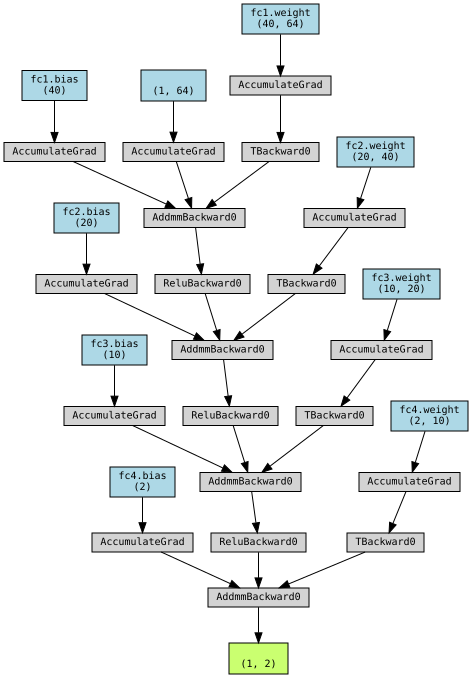

In [55]:
from torchviz import make_dot

x = torch.randn(1, n_ecog_channels, requires_grad=True)
y = net(x)
make_dot(y, params=dict(list(net.named_parameters())))

In [72]:
# @title 6.1. set up the training data

for i in range(60):
    V[:,i] = (V[:,i] - np.mean(V[:,i])) / np.std(V[:,i])
    
X = V

Y = np.zeros((len(cursorX), 2))
Y[:,0] = cursorX
Y[:,1] = cursorY

X = torch.tensor(X, dtype=torch.float32)
Y = torch.tensor(Y, dtype=torch.float32)
train_test_prop = 0.9
train_test_split = int(train_test_prop * len(X))

X_train = X[:train_test_split]
Y_train = Y[:train_test_split]

X_test = X[train_test_split:]
Y_test = Y[train_test_split:]



In [57]:

# @title 6.2. set up the loss function and optimizer

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(net.parameters(), lr=0.001)


In [58]:

# @title 6.3. train the network

for epoch in range(4000):
        
        optimizer.zero_grad()
        outputs = net(X_train)
        loss = criterion(outputs, Y_train)
        loss.backward()
        optimizer.step()
        
        print(f'Epoch {epoch}, Loss: {loss.item()}')
  

Epoch 0, Loss: 405787168.0
Epoch 1, Loss: 405786656.0
Epoch 2, Loss: 405786208.0
Epoch 3, Loss: 405785728.0
Epoch 4, Loss: 405785280.0
Epoch 5, Loss: 405784832.0
Epoch 6, Loss: 405784352.0
Epoch 7, Loss: 405783904.0
Epoch 8, Loss: 405783456.0
Epoch 9, Loss: 405783008.0
Epoch 10, Loss: 405782560.0
Epoch 11, Loss: 405782112.0
Epoch 12, Loss: 405781600.0
Epoch 13, Loss: 405781056.0
Epoch 14, Loss: 405780480.0
Epoch 15, Loss: 405779936.0
Epoch 16, Loss: 405779296.0
Epoch 17, Loss: 405778656.0
Epoch 18, Loss: 405777984.0
Epoch 19, Loss: 405777248.0
Epoch 20, Loss: 405776416.0
Epoch 21, Loss: 405775680.0
Epoch 22, Loss: 405774784.0
Epoch 23, Loss: 405773792.0
Epoch 24, Loss: 405772832.0
Epoch 25, Loss: 405771776.0
Epoch 26, Loss: 405770656.0
Epoch 27, Loss: 405769440.0
Epoch 28, Loss: 405768160.0
Epoch 29, Loss: 405766816.0
Epoch 30, Loss: 405765408.0
Epoch 31, Loss: 405763904.0
Epoch 32, Loss: 405762240.0
Epoch 33, Loss: 405760512.0
Epoch 34, Loss: 405758720.0
Epoch 35, Loss: 405756800.0
Ep

In [59]:
      
# @title 6.4. test the network

outputs = net(X_test)
loss = criterion(outputs, Y_test)
print(f'Loss: {loss.item()}')


Loss: 146668320.0


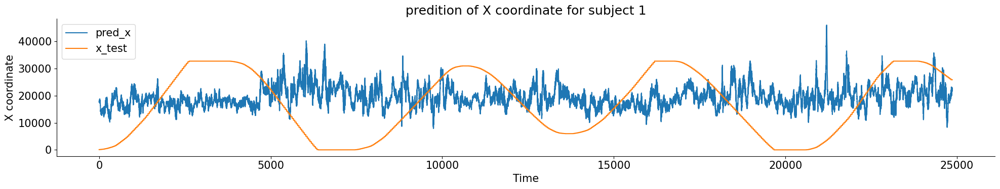

In [64]:

# @title 6.5. plot the predicted cursor movement

# check if outputs and Y_test are ndarray
if isinstance(outputs, torch.Tensor):
    outputs = outputs.detach().cpu().numpy()
    Y_test = Y_test.detach().cpu().numpy()

plt.plot(outputs[:,0], label='pred_x')
plt.plot(Y_test[:,0], label='x_test')
plt.title('predition of X coordinate for '+ subj_name)
plt.xlabel('Time')
plt.ylabel('X coordinate')
plt.legend()
plt.show()


# The loss is insanely high
what are we doing here
- setting up a 4 layer fc linear network with lower and lower dimensions
- trying to predict the joystick position from the ECoG data
- the loss is insanely high, and the model is not learning anything
- it seems as though a lot of the input data is still passing through the model, and the model is not learning anything

## time to build an autoencoder

In [67]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 8),
            nn.ReLU(),
            nn.Linear(8, 2)
        )
        self.decoder = nn.Sequential(
            nn.Linear(2, 8),
            nn.ReLU(),
            nn.Linear(8, 16),
            nn.ReLU(),
            nn.Linear(16, 32),
            nn.ReLU(),
            nn.Linear(32, 64),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

autoencoder = AutoEncoder().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)

In [70]:
# @title 7.1. train the autoencoder

for epoch in range(4000):
    optimizer.zero_grad()
    outputs = autoencoder(X_train)
    loss = criterion(outputs, X_train)
    loss.backward()
    optimizer.step()
    
    print(f'Epoch {epoch}, Loss: {loss.item()}')

Epoch 0, Loss: 1.1539565324783325
Epoch 1, Loss: 1.1539565324783325
Epoch 2, Loss: 1.1539565324783325
Epoch 3, Loss: 1.1539565324783325
Epoch 4, Loss: 1.1539565324783325
Epoch 5, Loss: 1.1539565324783325
Epoch 6, Loss: 1.1539565324783325
Epoch 7, Loss: 1.1539565324783325
Epoch 8, Loss: 1.1539565324783325
Epoch 9, Loss: 1.1539565324783325
Epoch 10, Loss: 1.1539565324783325
Epoch 11, Loss: 1.1539565324783325
Epoch 12, Loss: 1.1539565324783325
Epoch 13, Loss: 1.1539565324783325
Epoch 14, Loss: 1.1539565324783325
Epoch 15, Loss: 1.1539565324783325
Epoch 16, Loss: 1.1539565324783325
Epoch 17, Loss: 1.1539565324783325
Epoch 18, Loss: 1.1539565324783325
Epoch 19, Loss: 1.1539565324783325
Epoch 20, Loss: 1.1539565324783325
Epoch 21, Loss: 1.1539565324783325
Epoch 22, Loss: 1.1539565324783325
Epoch 23, Loss: 1.1539565324783325
Epoch 24, Loss: 1.1539565324783325
Epoch 25, Loss: 1.1539565324783325
Epoch 26, Loss: 1.1539565324783325
Epoch 27, Loss: 1.1539565324783325
Epoch 28, Loss: 1.153956532478

# The loss is not changing

- we need to change the loss


Loss: 2.0832037925720215


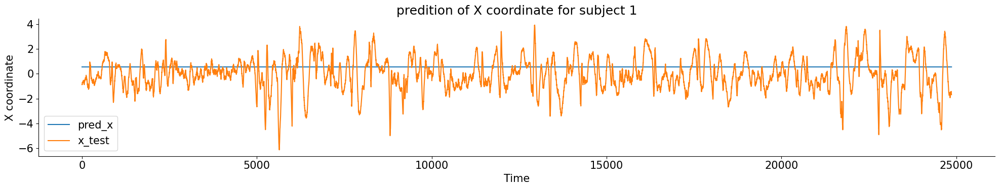

In [73]:
# @title 7.2. test the autoencoder

outputs = autoencoder(X_test)
loss = criterion(outputs, X_test)
print(f'Loss: {loss.item()}')

# @title 7.3. plot the predicted neural responses

outputs = outputs.detach().cpu().numpy()
X_test = X_test.detach().cpu().numpy()

plt.plot(outputs[:,0], label='pred_x')
plt.plot(X_test[:,0], label='x_test')
plt.title('predition of X coordinate for '+ subj_name)

plt.xlabel('Time')

plt.ylabel('X coordinate')

plt.legend()

plt.show()